link to the excercises
https://www.coursera.org/learn/image-processing/supplement/624kl/optional-programming-exercises

In [1]:
import cv2
import numpy as np
from PIL import Image, ImageOps 
from pathlib import Path
import cv2
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
img_path = Path(r"C:\IT\Image and Video Processing From Mars to Hollywood with a Stop at the Hospital\notebooks\images\300px-Unequalized_Hawkes_Bay_NZ.jpg")

In [3]:
img = Image.open(img_path)
img_array = np.array(img)

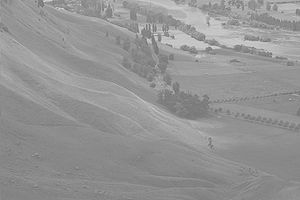

In [4]:
img

In [5]:
#sns.histplot(img_array, legend=False, bins=100)

In [6]:
# implement histogram equalization

#start with one channel, based on https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_histograms/py_histogram_equalization/py_histogram_equalization.html
def equalize(img: np.ndarray):
    hist, bins = np.histogram(img.flatten(), 256, [0, 256])
    # cumulative distribution function
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max()/cdf.max()
    cdf_m = np.ma.masked_equal(cdf,0)
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    cdf = np.ma.filled(cdf_m,0).astype('uint8')
    return cdf[img]

In [16]:
equalized = equalize(img_array)

In [17]:
#sns.histplot(equalized, legend=False, bins=256)

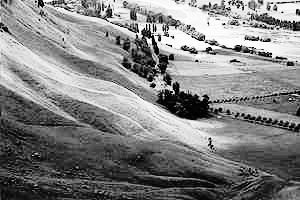

In [18]:
Image.fromarray(equalized)

In [33]:
# my version based on https://levelup.gitconnected.com/introduction-to-histogram-equalization-for-digital-image-enhancement-420696db9e43
cumsum = img_array.flatten().cumsum()
normalized_cumsum = cumsum / img_array.sum()

In [36]:
normalized_cumsum.shape

(60000,)

In [34]:
cumsum.max(), normalized_cumsum.max()

(8879159, 1.0)

In [38]:
# once we have normalized values, we just need a lookup tale for each of 256 values
number_of_shades = 255
hist, bins = np.histogram(normalized_cumsum, 255)

In [55]:
transform_map = (number_of_shades*normalized_cumsum).astype(np.uint8)

In [64]:
transform_map.shape

(60000,)

In [71]:
np.zeros(img_array.flatten().shape).shape

(60000,)

In [83]:
flatten = img_array.flatten()
transformed = np.zeros(flatten.shape)
for i in range(img_array.flatten().shape[0]):
    transformed[i] = transform_map[flatten[i]]
transformed = transformed.reshape(img_array.shape)

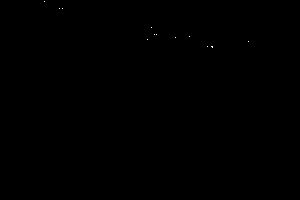

In [84]:
Image.fromarray(transformed.reshape(img_array.shape))

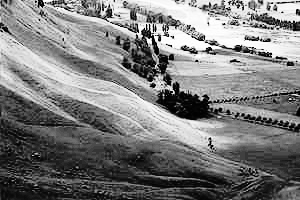

In [342]:
# use PIL function
ImageOps.equalize(img)

something went wrong, come back later
Probably something with types

In [125]:
img_lena_gray_path = Path(r"C:\IT\Image and Video Processing From Mars to Hollywood with a Stop at the Hospital\notebooks\images\lena_gray.png")
lena_gray = Image.open(img_lena_gray_path).convert("L")
lena_gray_array = np.array(lena_gray)

In [131]:
lena_gray_array

array([[162, 162, 162, ..., 170, 155, 128],
       [162, 162, 162, ..., 170, 155, 128],
       [162, 162, 162, ..., 170, 155, 128],
       ...,
       [ 43,  43,  50, ..., 104, 100,  98],
       [ 44,  44,  55, ..., 104, 105, 108],
       [ 44,  44,  55, ..., 104, 105, 108]], dtype=uint8)

In [152]:
def median_filer(img, size=3):
    edge_shift = size//2
    #TODO check why I had to cast right here!!!
    filetered_image = np.zeros(img.shape).astype(np.uint8)
    for i in range(edge_shift, img.shape[0]-edge_shift):
        for j in range(edge_shift, img.shape[1]-edge_shift):        
            filetered_image[i, j] = np.median(img[i-edge_shift:i+edge_shift, j-edge_shift:j+edge_shift])
    return filetered_image

In [165]:
filtered = median_filer(lena_gray_array, 9)

In [324]:
# TODO compare with median filter from PIL https://pillow.readthedocs.io/en/stable/_modules/PIL/ImageFilter.html#MedianFilter

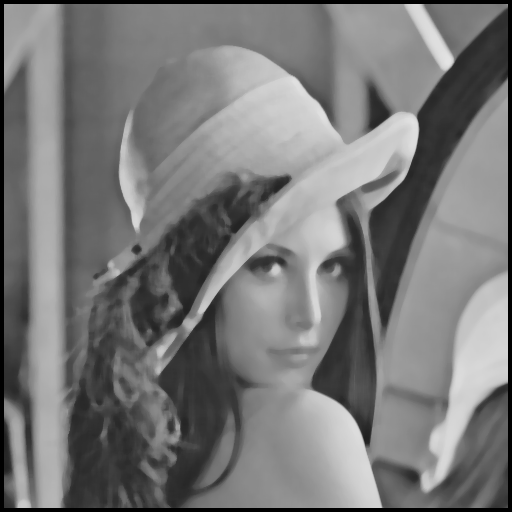

In [167]:
Image.fromarray(filtered, mode="L")

Non local means

I will not implement it from scratch, just use opencv functions

In [250]:
piwo_path = Path(r"C:\IT\Image and Video Processing From Mars to Hollywood with a Stop at the Hospital\notebooks\images\piwo.jpg")
piwo = Image.open(piwo_path)

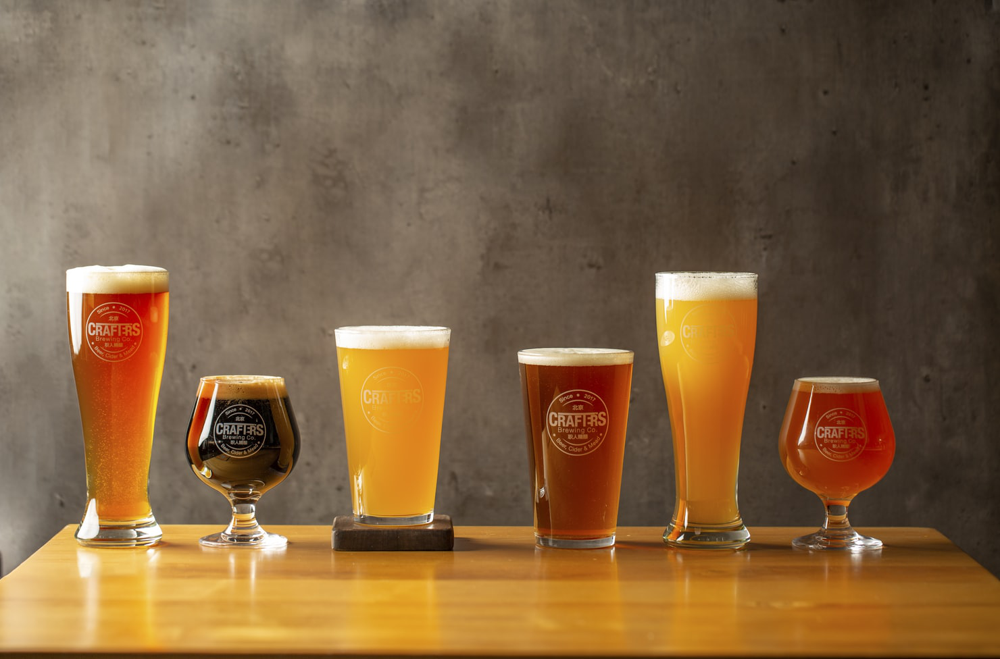

In [251]:
piwo

In [300]:
def add_gausian_noise(img, mean=0, std=1, max_noice_val=1, num_of_times=1):
    noised = img.astype(np.int16)
    for _ in range(num_of_times):
        noise = np.random.normal(mean, std, img.shape) * max_noice_val
        noise = noise.astype(np.int16)
        noised = np.clip(noised + noise, 0, 255)
    return noised.astype(np.uint8)

In [288]:
piwo_arr = np.array(piwo)

In [303]:
noised_piwo = add_gausian_noise(piwo_arr, max_noice_val=10)

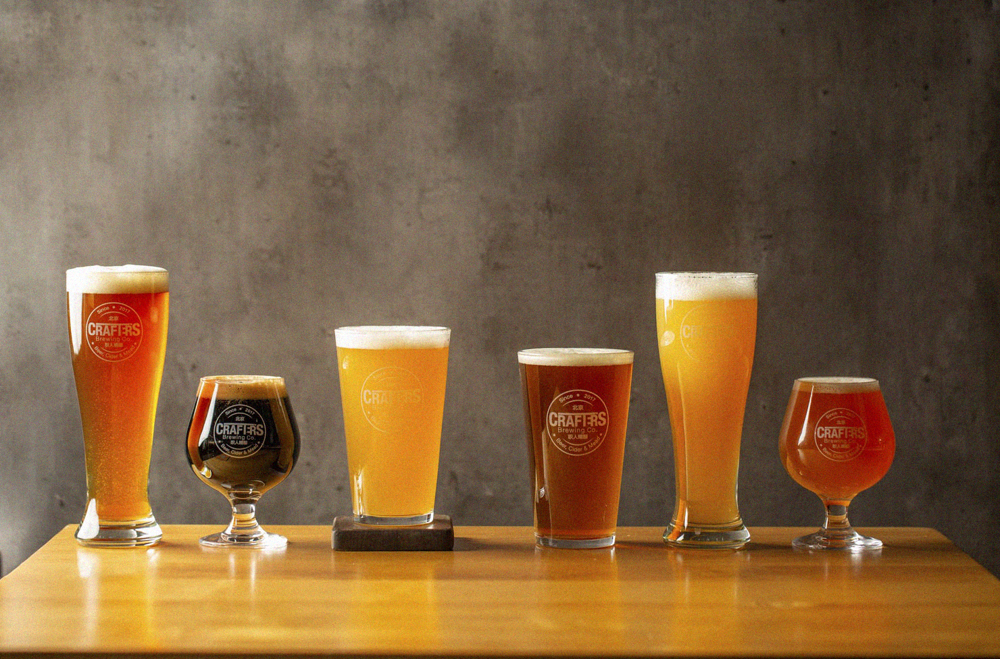

In [304]:
Image.fromarray(noised_piwo)

In [305]:
denoised = cv2.fastNlMeansDenoisingColored(piwo_arr)

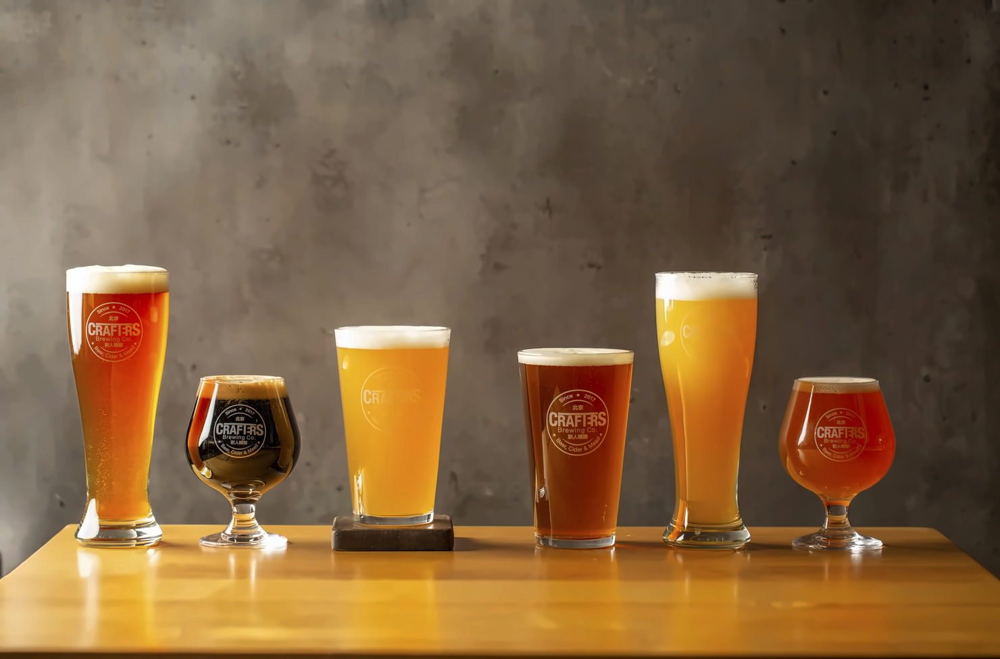

In [306]:
Image.fromarray(denoised)

In [261]:
bean_path = Path(r"C:\IT\Image and Video Processing From Mars to Hollywood with a Stop at the Hospital\notebooks\images\noisy_bean.jpg")
bean = Image.open(bean_path)

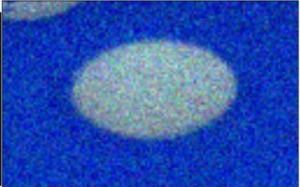

In [262]:
bean

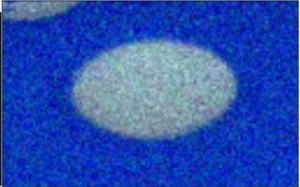

In [269]:
denoised = cv2.fastNlMeansDenoisingColored(np.array(bean), h=1)
Image.fromarray(denoised)

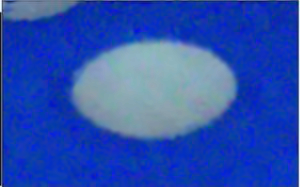

In [267]:
denoised = cv2.fastNlMeansDenoisingColored(np.array(bean), h=10)
Image.fromarray(denoised)

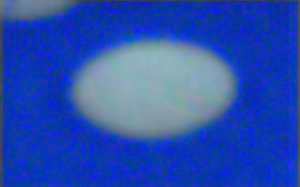

In [268]:
denoised = cv2.fastNlMeansDenoisingColored(np.array(bean), h=100)
Image.fromarray(denoised)

Consider an image and add to it random noise. Repeat this N times, for different values of N, and add the resulting images. What do you observe?

In [273]:
lena_path = Path(r"C:\IT\Image and Video Processing From Mars to Hollywood with a Stop at the Hospital\notebooks\images\lena.png")
lena = Image.open(lena_path)
lena_arr = np.array(lena)

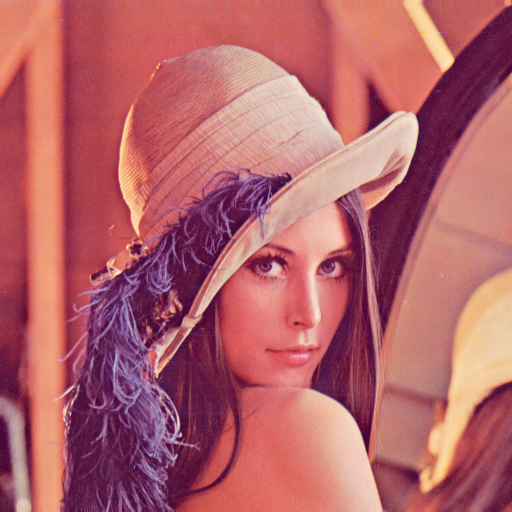

In [275]:
lena

adding noise more times makes it more noised. I suspected, that noise might cancel previous iterations

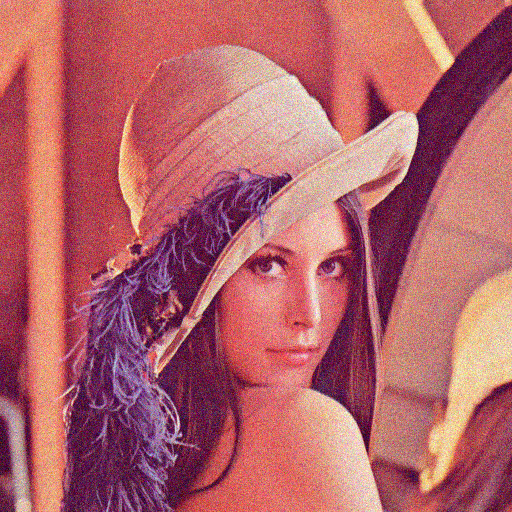

In [319]:
noisy_lena = add_gausian_noise(lena_arr, max_noice_val=5, num_of_times=20)
Image.fromarray(noisy_lena)

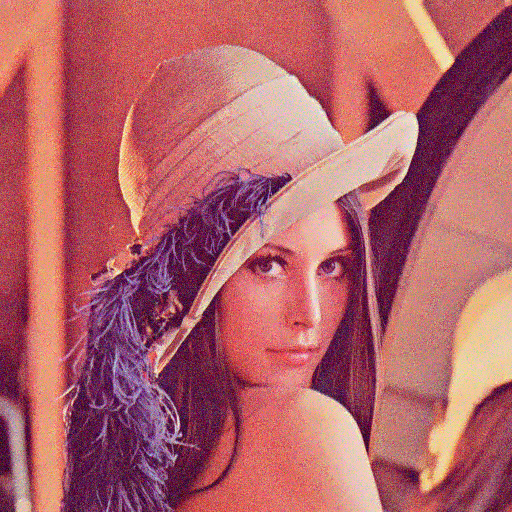

In [320]:
denoised_lena = cv2.fastNlMeansDenoisingColored(noisy_lena, h=5)
Image.fromarray(denoised_lena)

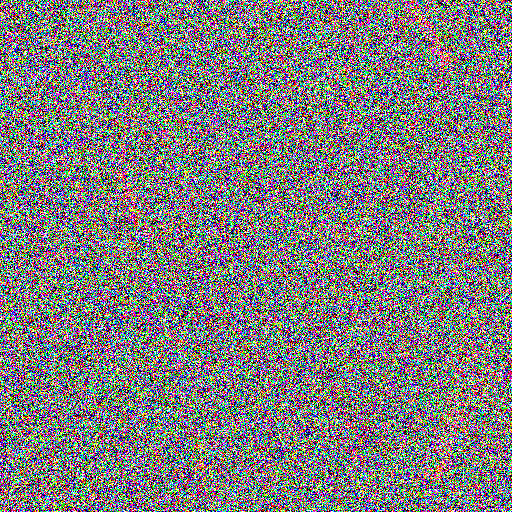

In [321]:
imgs_differene = noisy_lena-lena
Image.fromarray(imgs_differene)

Implement the basic color edge detector. What happens when the 3 channels are equal?

In [322]:
# PIL provides function for filtering
from PIL.ImageFilter import Kernel

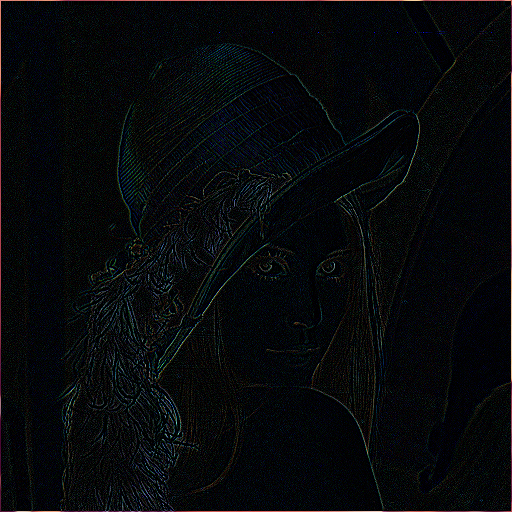

In [340]:
kernel_values = (0, 1, 0, 1, -4, 1, 0, 1, 0)
edge_filter = Kernel((3, 3), kernel_values, 1, 0)
lena.filter(edge_filter)

Take a video and do frame-by-frame histogram equalization and run the resulting video. Now consider a group of frames as a large image and do histogram equalization for all of them at once. What looks better?

In [5]:
vid_path = r"C:\IT\AdvancedComputerVisionWithPython\Videos\Did_i_stutter.mp4"
vid_equalized_frame_by_frame = r"C:\IT\AdvancedComputerVisionWithPython\Videos\Did_i_stutter_equalized_frame_by_frame.mp4"
vid_equalized_group = r"C:\IT\AdvancedComputerVisionWithPython\Videos\Did_i_stutter_equalized_group.mp4"

equalize frame by frame

In [9]:
def equalize_vid_fbf(in_vid_path, out_vid_path, vid_frame_shape):
    cap = cv2.VideoCapture(in_vid_path)
    vid_writer = cv2.VideoWriter(out_vid_path, -1, 30, vid_frame_shape) 
    ret, frame = cap.read()
    while ret:
        ret, frame = cap.read()
        if ret:
            equalized = np.array(ImageOps.equalize(Image.fromarray(frame)))
            vid_writer.write(equalized)
    cap.release()
    vid_writer.release()

In [24]:
equalize_vid_fbf(vid_path, vid_equalized_frame_by_frame, (442, 238))

equalize group of frames

In [35]:
# not sure how to do it now, skipping
def equalize_vid_group_frames(in_vid_path, out_vid_path, vid_frame_shape, frames_in_group=10):
    """the idea is to select a group of frameas and concatenate them 
    (verticaly or horizontaly, it doesn't matter) then equalize "super" frame and go back to the single frames"""
    cap = cv2.VideoCapture(in_vid_path)
    vid_writer = cv2.VideoWriter(out_vid_path, -1, 30, vid_frame_shape) 
    ret, frame = cap.read()
    frame_group = []
    frames_group_counter = 0
    while ret:
        ret, frame = cap.read()
        if ret:
            frame_group.append(frame)
            frames_group_counter += 1
            if frames_group_counter == frames_in_group:
                group = np.array(frame_group)
                original_shape = group.shape
                new_shape = (frame.shape[0] * group.shape[0], frame.shape[1], frame.shape[2])
                reshaped_group = group.reshape(new_shape)
                equalized = np.array(ImageOps.equalize(Image.fromarray(reshaped_group)))
                reshaped_back = equalized.reshape(original_shape)
                for equalized_frame in reshaped_back:
                    vid_writer.write(equalized_frame)
                frames_group_counter = 0
                frame_group = []
    cap.release()
    vid_writer.release()

In [36]:
equalize_vid_group_frames(vid_path, vid_equalized_group, (442, 238))

In [16]:
elo = [img_array, img_array, img_array]
elo = np.array(elo)
elo.shape

(3, 200, 300)

In [27]:
6311760 / 442

14280.0